In [1]:
from scipy.io import loadmat 
import numpy as np
import matplotlib.pyplot as plt
from skimage import exposure
from osgeo import gdal
import os
import gc
import json
from tqdm import iqdm
from matplotlib.colors import LinearSegmentedColormap

## Работа с оптическими данными. 

![landsat.jpg](https://repository-images.githubusercontent.com/420687855/b38f9de5-a273-436c-a6f2-3509df4c6f45)

Вам предоставлены данные со спутника **Landsat 8** (https://earthexplorer.usgs.gov/)

**Landsat 8**, работает с сенсором OLI/TIRS (Operational Land Imager / Thermal Infrared Sensor), который предоставляет данные с 11 спектральных каналов:


<img src="Relevant Images/SpecChan.png" width="600">


<img src="Relevant Images/Bands.png" width="600">


In [ ]:
def getCurrPth():
    return os.path.join(os.getcwd())
def getDataPth(curr_path):
    return os.path.join(curr_path, 'Datasets')
def getDirsPths(datasets_path, Path_num = -1, Spec_path = ''):
    datasets_dirs = os.listdir(datasets_path)
    Landsat8_dirs_paths = [os.path.join(datasets_path, i) for i in datasets_dirs if 'LC08' in i]
    if (Path_num != -1):
        Landsat8_dirs_paths = [Landsat8_dirs_paths[Path_num]]
        return Landsat8_dirs_paths
    if (not Spec_path):
        Landsat8_dirs_paths = [pth for pth in Landsat8_dirs_paths if Spec_path in pth]
        return Landsat8_dirs_paths
    return Landsat8_dirs_paths
def getBandsNRescalingPths(Landsat8_dirs_paths):
    Landsat8_bands_paths = [[os.path.join(i, j) for j in os.listdir(i) if ('B' in j) and ('.TIF' in j)] for i in Landsat8_dirs_paths]
    Landsat8_rescaling_paths = [[os.path.join(i, j) for j in os.listdir(i) if ('MTL.json' in j)] for i in Landsat8_dirs_paths]
    return Landsat8_bands_paths, Landsat8_rescaling_paths
def Carve(band, top, left, height = 500, width = 500):
    return band[..., top:top+height, left:left+width]
def getPreDataset(Landsat8_bands_paths, save = False, curr_path = '', title = 'Band-1 example'):
    PreDataset = []
    for image_path in Landsat8_bands_paths:
        band0 = gdal.Open(image_path[0], gdal.GA_ReadOnly).ReadAsArray()
        shp = (11,)+band0.shape
        Sample = np.zeros(shp)
        for band_path in image_path:
            gdalband = gdal.Open(band_path, gdal.GA_ReadOnly)
            #rasterband = gdalband.GetRasterBand(1)
            band = gdalband.ReadAsArray()
            band_num = band_path[-6:-4]
            if 'B' in band_num:
                band_num = band_num[1]
            band_num = int(band_num)
            if band_num == 8:
                band = band[::2, ::2]
            Sample[band_num-1] = band
            fig, ax = plt.subplots()
            ax.imshow(band[::10, ::10], cmap='gray')
            ax.set_title(f'Band {band_num}')
            plt.show()
            if (band_num == 1) and (save):
                if (not curr_path):
                    curr_path = getCurrPth()
                fig.savefig(os.path.join(curr_path, 'Relevant Images', title+'.png'))
        PreDataset.append(Sample)
    return PreDataset
def NumPieces(Tops):
    Num = 0
    for i in Tops:
        Num+=len(i)
    return Num
def rescale(data, rescale_path):
    Q = data.astype(np.float64)
    with open(rescale_path) as js:
        arr = json.load(js)['LANDSAT_METADATA_FILE']['LEVEL1_RADIOMETRIC_RESCALING']
        mul = 'RADIANCE_MULT_BAND_'
        add = 'RADIANCE_ADD_BAND_'
        M_l = np.array([float(arr[mul+str(i+1)]) for i in range(11)])
        A = np.array([float(arr[add+str(i+1)]) for i in range(11)])
    L  = (M_l*Q.T+A).T
    return L
def getDataset(Tops, Lefts, PreDataset, Landsat8_rescaling_paths, show_imgs = True, save_imgs = False, curr_path = '', title = 'DatasetImgs'):
    NPieces = NumPieces(Tops)
    DatasetShape = (NPieces,)+(11, 500, 500)
    Dataset = np.zeros(DatasetShape)
    if (not show_imgs):
        for i, Sample in tqdm(enumerate(PreDataset)):
            tops = Tops[i]
            lefts = Lefts[i]
            Rescale_path = Landsat8_rescaling_paths[i][0]
            for j in range(len(tops)):
                top, left = tops[j], lefts[j]
                piece = Carve(Sample, top = top, left = left)
                Piece = rescale(piece, Rescale_path)
                Dataset[j] = Piece
        return Dataset
    fig, axss = plt.subplots(NPieces, 4, figsize=(32, 8*NPieces))
    NoPiece = 0
    axss[NoPiece][0].set_title('Piece\'s band 1')
    axss[NoPiece][1].set_title('Piece\'s band 1 histogram')
    axss[NoPiece][2].set_title('Piece\'s band 1 rescaled')
    axss[NoPiece][3].set_title('Piece\'s colored image')
    for i, Sample in enumerate(PreDataset):
        tops = Tops[i]
        lefts = Lefts[i]
        Rescale_path = Landsat8_rescaling_paths[i][0]
        for j in range(len(tops)):
            NoPiece += 1
            top, left = tops[j], lefts[j]
            piece = Carve(Sample, top = top, left = left)
            Piece = rescale(piece, Rescale_path)
            Dataset[j] = Piece
            RGB = np.zeros(Piece[1:4].shape[::-1])
            RGB[..., 0] = exposure.equalize_hist(Piece[3])
            RGB[..., 1] = exposure.equalize_hist(Piece[2])
            RGB[..., 2] = exposure.equalize_hist(Piece[1])
            ax_img, ax_hist, ax_eq, ax_rgb = axss[NoPiece]
            ax_img.imshow(piece[0], cmap='gray')
            ax_img.set_axis_off()
            ax_hist.hist(piece[0].ravel(), bins=256, color='black')
            eq = ax_eq.imshow(Piece[0], cmap = 'gray')
            ax_eq.set_axis_off()
            plt.colorbar(eq, ax = ax_eq)
            ax_rgb.imshow(RGB)
            ax_rgb.set_axis_off()
    fig.tight_layout()
    plt.show()
    if save_imgs:
        if (not curr_path):
            curr_path = getCurrPth()
        fig.savefig(os.path.join(curr_path, 'Relevant Images', title+'.png'))
    return Dataset

In [3]:
curr_path = getCurrPth()
datasets_path = getDataPth(curr_path)
print(datasets_path)

C:\Users\andra\Desktop\Informatics\DAProject\Satellite\Datasets


In [5]:
Path_num = 0
Landsat8_dirs_paths = getDirsPths(datasets_path, Path_num = Path_num)
print(Landsat8_dirs_paths)

['C:\\Users\\andra\\Desktop\\Informatics\\DAProject\\Satellite\\Datasets\\LC08_L1GT_176006_20241004_20241008_02_T2']


In [7]:
Landsat8_bands_paths, Landsat8_rescaling_paths = getBandsNRescalingPths(Landsat8_dirs_paths)
print(Landsat8_rescaling_paths)

[['C:\\Users\\andra\\Desktop\\Informatics\\DAProject\\Satellite\\Datasets\\LC08_L1GT_176006_20241004_20241008_02_T2\\LC08_L1GT_176006_20241004_20241008_02_T2_MTL.json']]


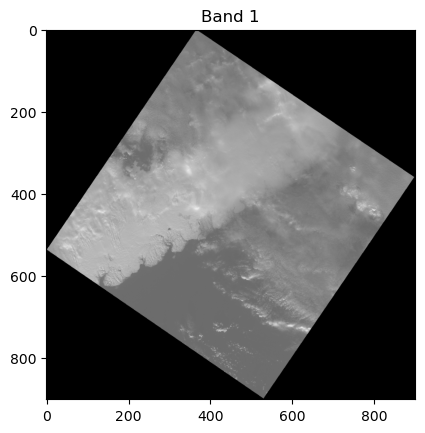

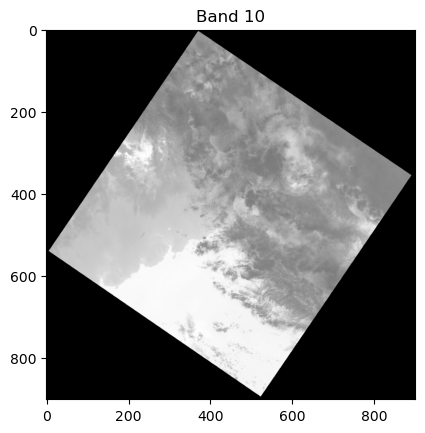

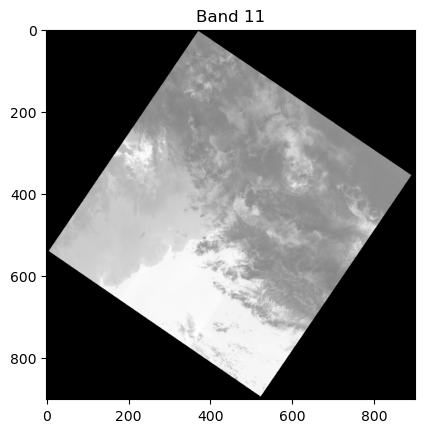

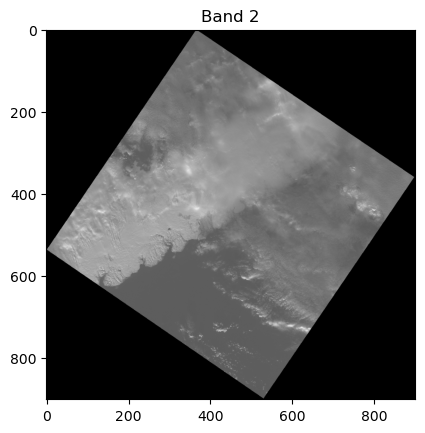

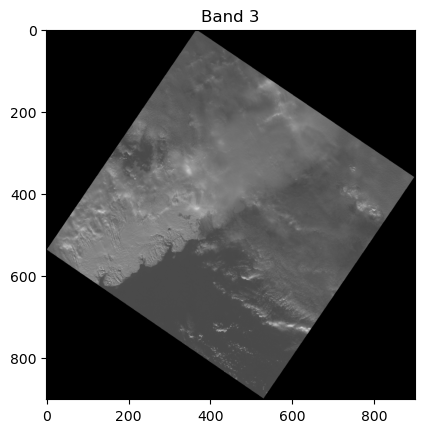

...

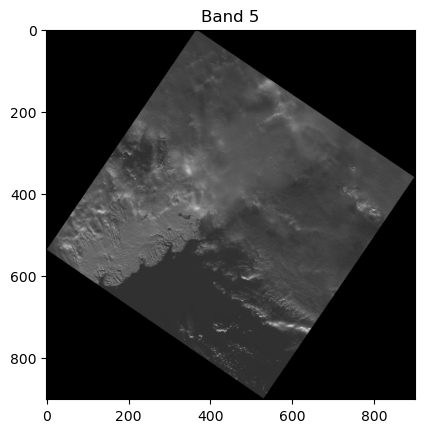

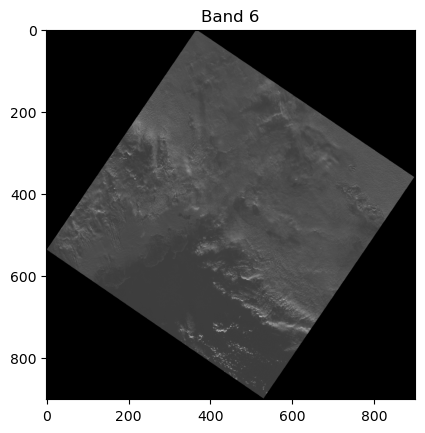

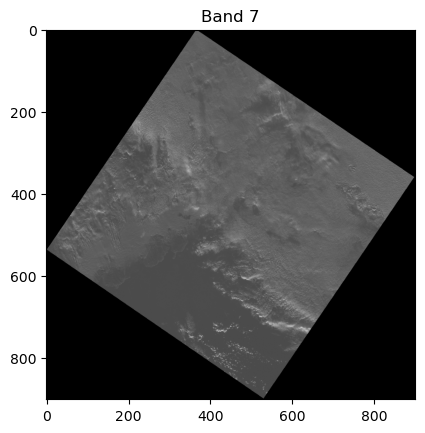

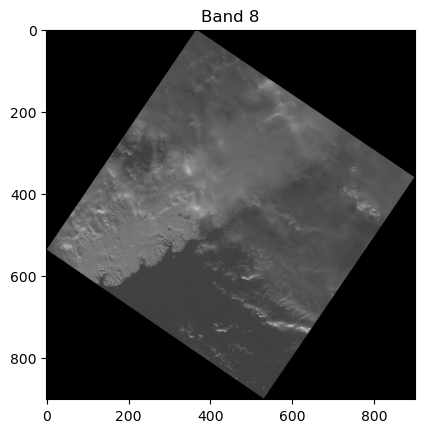

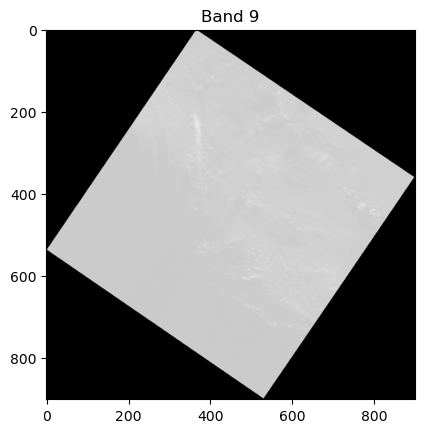

In [11]:
PreDataset = getPreDataset(Landsat8_bands_paths)

In [18]:
print(PreDataset[0].shape)

(11, 9011, 8991)


In [135]:
P = np.array([[[3, 2], [5, 4]], [[1, 3], [6, 8]]])
M_l = np.array([2, 1])
A = np.array([3, 5])
print((M_l*P.T+A).T)

[[[ 9  7]
  [13 11]]

 [[ 6  8]
  [11 13]]]


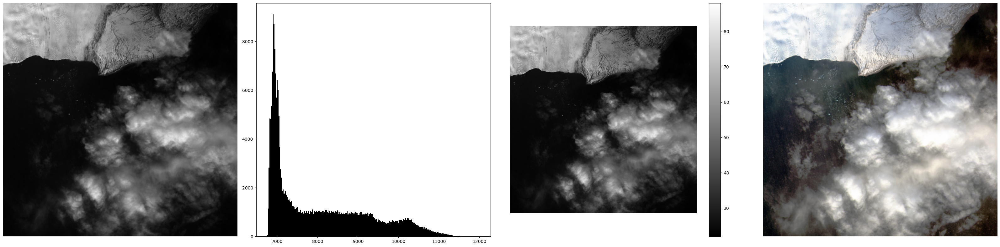

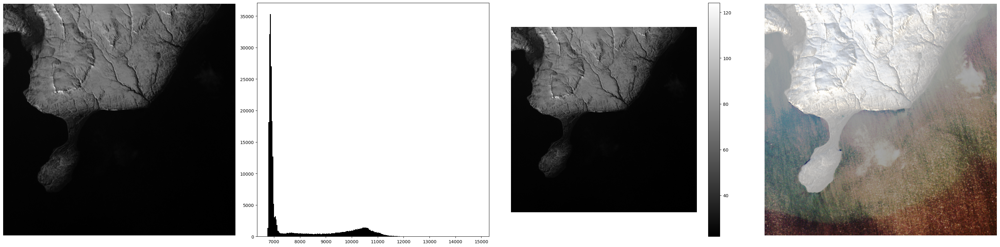

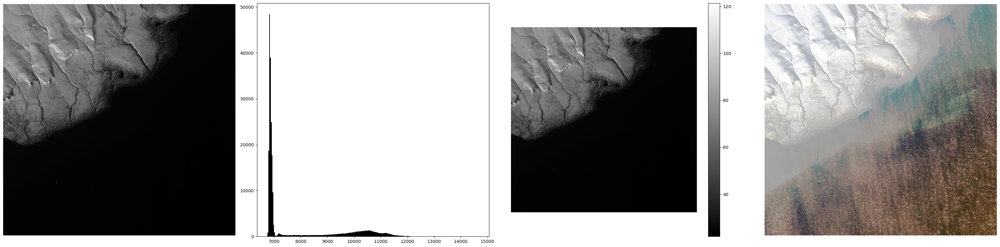

In [15]:
Tops = [
    [5000, 5200, 5500]
]
Lefts = [
    [3500, 3000, 2500]
]
'''Tops = [
    [3000]
]
Lefts = [
    [2700]
]''''''
Tops = [
    [5000]
]
Lefts = [
    [5500]
]'''
Dataset = getDataset(Tops, Lefts, PreDataset, Landsat8_rescaling_paths)

In [23]:
del PreDataset
gc.collect()

23398

## Рассчитайте  индекс NDVI. Рассчитайте индекс NDWI

**NDVI** (Normalized Difference Vegetation Index) – Нормализованный разностный вегетационный индекс

**NDVI** применяется для оценки плотности и здоровья растительного покрова. Этот индекс основан на том, что растения активно поглощают красный свет (RED, 0.6–0.7 мкм) и сильно отражают ближний инфракрасный свет (NIR, 0.7–1.1 мкм).


Формула для расчета: 

$$
NDVI = \frac{NIR - RED}{NIR + RED}
$$


Значения NDVI варьируются от -1.0 до 1.0, где отрицательные значения чаще всего указывают на наличие облаков, водной поверхности или снега, а значения, близкие к нулю — на скалы или оголенную почву.

Очень низкие значения NDVI (0.1 и меньше) могут быть связаны с наличием на снимке пустых скалистых участков, песка или снега.

Средние значения (от 0.2 до 0.3) говорят об обнаружении кустарников и лугов, а высокие значения (от 0.6 до 0.8) — лесов умеренного и тропического пояса.



**NDWI** применяется для выделения водных объектов (реки, озера, моря) и оценки водосодержания в растительности. Он основан на соотношении ближнего инфракрасного (NIR) и среднеинфракрасного (SWIR, 1.2–2.5 мкм) излучения.

Формула для рассчета:

$$
NDWI = \frac{NIR - SWIR}{NIR + SWIR}
$$

 - **NDWI** < -0.45: Водные объекты (озера, реки, океан). (**?**)


0 и выше: Водные тела (озера, реки, океаны).
0.0 - 0.2: Влажные территории, такие как болота, влажные почвы, заболоченные участки.
0.0 и ниже: Сухие участки, такие как земля, скалы, пустыни, неводные экосистемы.


In [ ]:
def VisualizeIdxs(Dataset, save_imgs = False, curr_path = '', title = 'IdxsVisualization'):
    for i, Piece in enumerate(Dataset):
        NIR = Piece[4]
        RED = Piece[3]
        GREEN = Piece[2]
        SWIR1 = Piece[5]
        SWIR2 = Piece[6]
        NDVI = (NIR-RED)/(NIR+RED)
        NDWI = (NIR-SWIR2)/(NIR+SWIR2)
        MNDWI = (GREEN-SWIR2)/(GREEN+SWIR2)
        NDSI = (GREEN-SWIR1)/(GREEN+SWIR1)
        WRI = (GREEN+RED)/(NIR+SWIR2)
        NDTI = (RED-GREEN)/(RED+GREEN)
        ANDWI = (Piece[9]-Piece[3])/(Piece[9]+Piece[3])
        fig, axs = plt.subplots(2, 4, figsize=(28, 16))
        axs1r, axs2r = axs
        ax_ndvi, ax_ndwi, ax_mndwi, ax_ndsi = axs1r
        ax_andwi, ax_wri, ax_ndti, ax_null = axs2r
        nv = ax_ndvi.imshow(NDVI, cmap='jet')
        nw = ax_ndwi.imshow(NDWI, cmap='jet')
        mnw = ax_mndwi.imshow(MNDWI, cmap='jet')
        ns = ax_ndsi.imshow(NDSI, cmap='jet')
        anw = ax_andwi.imshow(ANDWI, cmap='jet')
        wr = ax_wri.imshow(WRI, cmap='jet')
        nd = ax_ndti.imshow(NDTI, cmap='jet')
        plt.colorbar(nv, ax = ax_ndvi)
        plt.colorbar(nw, ax = ax_ndwi)
        plt.colorbar(mnw, ax = ax_mndwi)
        plt.colorbar(ns, ax = ax_ndsi)
        plt.colorbar(nw, ax = ax_andwi)
        plt.colorbar(mnw, ax = ax_wri)
        plt.colorbar(ns, ax = ax_ndti)
        ax_ndvi.set_axis_off()
        ax_ndwi.set_axis_off()
        ax_mndwi.set_axis_off()
        ax_ndsi.set_axis_off()
        ax_andwi.set_axis_off()
        ax_wri.set_axis_off()
        ax_ndti.set_axis_off()
        ax_ndvi.set_title('NDVI')
        ax_ndwi.set_title('NDWI')
        ax_mndwi.set_title('MNDWI')
        ax_ndsi.set_title('NDSI')
        ax_andwi.set_title('ANDWI')
        ax_wri.set_title('WRI')
        ax_ndti.set_title('NDTI')
        fig.tight_layout()
        plt.show()
        if (save_imgs) and (i == 0):
            if (not curr_path):
                curr_path = getCurrPth()
            fig.savefig(os.path.join(curr_path, 'Relevant Images', title+'.png'))
def setLabels(Dataset):
    Dshape = Dataset.shape
    Lshape = (Dshape[0], 5,)+Dshape[2:]
    Labels = np.zeros(Lshape)
    for i, Piece in tqdm(enumerate(Dataset)):
        NIR = Piece[4]
        RED = Piece[3]
        GREEN = Piece[2]
        SWIR1 = Piece[5]
        SWIR2 = Piece[6]
        TIR1 = Piece[9]
        NDVI = (NIR-RED)/(NIR+RED)
        NDWI = (NIR-SWIR2)/(NIR+SWIR2)
        MNDWI = (GREEN-SWIR2)/(GREEN+SWIR2)
        NDSI = (GREEN-SWIR1)/(GREEN+SWIR1)
        ANDWI = (TIR1-RED)/(TIR1+RED)
        Clouds = ((NDWI < 0.93)*(MNDWI < 0.95)*(NDSI < 0.88))
        NClouds = np.logical_not(Clouds)
        Water = (NClouds * (ANDWI > 0.9) * (NDVI < -0.4))
        NWater = np.logical_not(Water)
        Vegetation = (NClouds * NWater * (NDVI > 0.2))
        NVegetation = np.logical_not(Vegetation)
        Snow = (NClouds * NWater * NVegetation * (NDSI > 0.85) * (-0.4 < NDVI < 0))
        NSnow = np.logical_not(Snow)
        Land = (NClouds * NWater * NVegetation * NSnow)
        Label = np.array([Clouds, Water, Vegetation, Snow, Land])+0
        Labels[i] = Label
    return Labels
def VisualiseDatasetNLabels(Dataset, Labels, save_imgs = False, curr_path = '', title = 'SimpleMap'):
    for Piece, Label in zip(Dataset, Labels):
        RGB = np.zeros(Piece[1:4].shape[::-1])
        RGB[..., 0] = exposure.equalize_hist(Piece[3])
        RGB[..., 1] = exposure.equalize_hist(Piece[2])
        RGB[..., 2] = exposure.equalize_hist(Piece[1])
        Map = np.zeros(Piece.shape[1:])
        for j, Mask in enumerate(Label):
            Map[Mask == 1] = j
        fig, axs = plt.subplots(1, 2, figsize = (16, 8))
        rgb, mp = axs
        rgb.imshow(RGB)
        rgb.set_axis_off()
        rgb.set_title('Colored image')
        colors = [[130,134,133], [0,255,255], [92,169,4], [255,250,250], [162,101,62]]
        n_bins = len(colors)
        cmapName = 'SimpleMap'
        cmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bin)
        ax_map = mp.imshow(Map, cmap=cmap)
        plt.colorbar(ax_map, ax = mp)
        mp.set_axis_off()
        mp.set_title('Simple map')
        fig.tight_layout()
        plt.show()
        if (save_imgs) and (Piece == Dataset[0]):
            if (not curr_path):
                curr_path = getCurrPth()
            fig.savefig(os.path.join(curr_path, 'Relevant Images', title+'.png'))
def SaveDatasetNLabels(Dataset, Labels, datasets_path, Landsat8_dirs_paths):
    Pth = os.path.join(datasets_path, 'Numpy')
    Postfix = ''
    for LS8 in Landsat8_dirs_paths:
        Postfix+='_'+LS8[-40:]
    np.save(os.path.join(Pth, 'Dataset'+Postfix), Dataset)
    np.save(os.path.join(Pth, 'Labels'+Postfix), Labels)

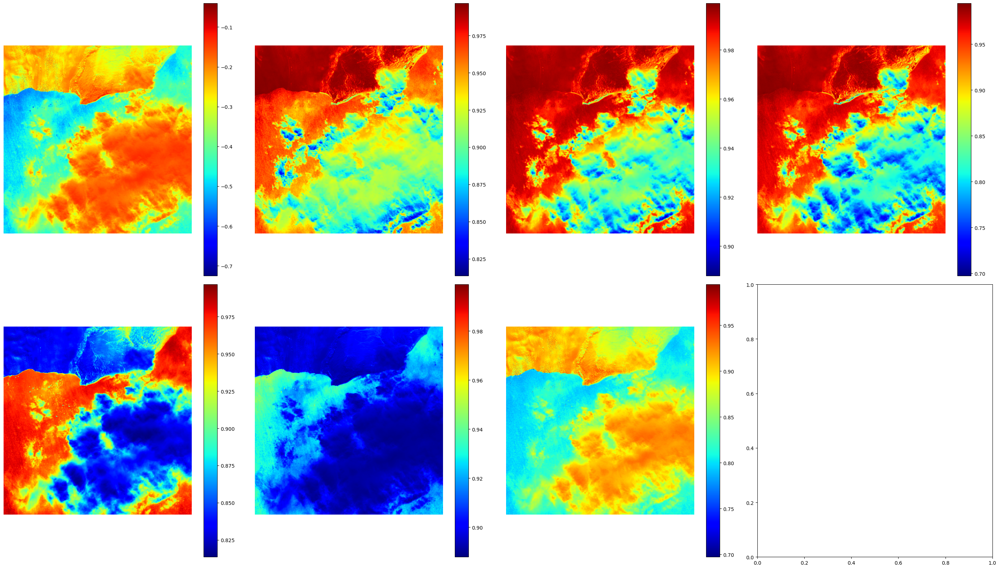

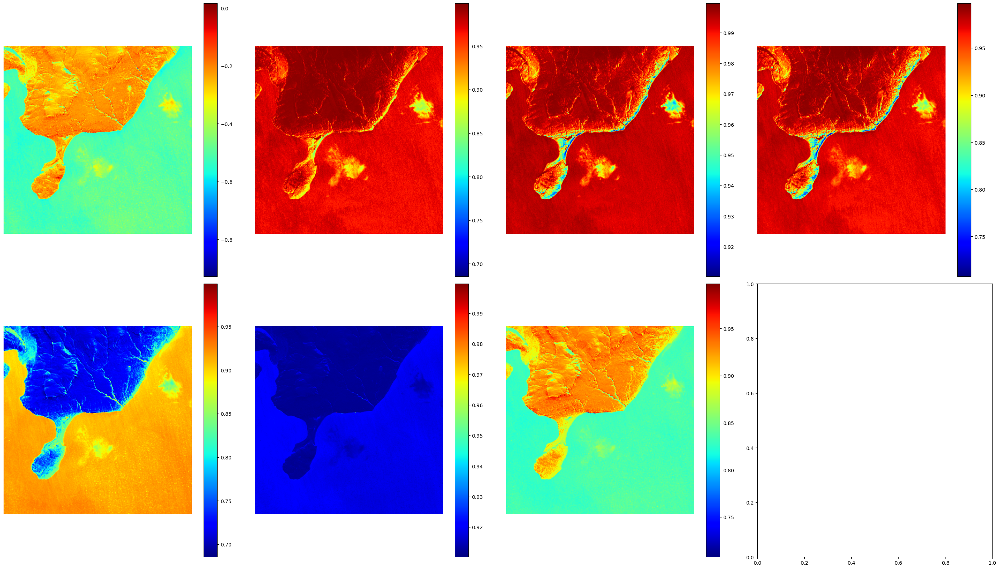

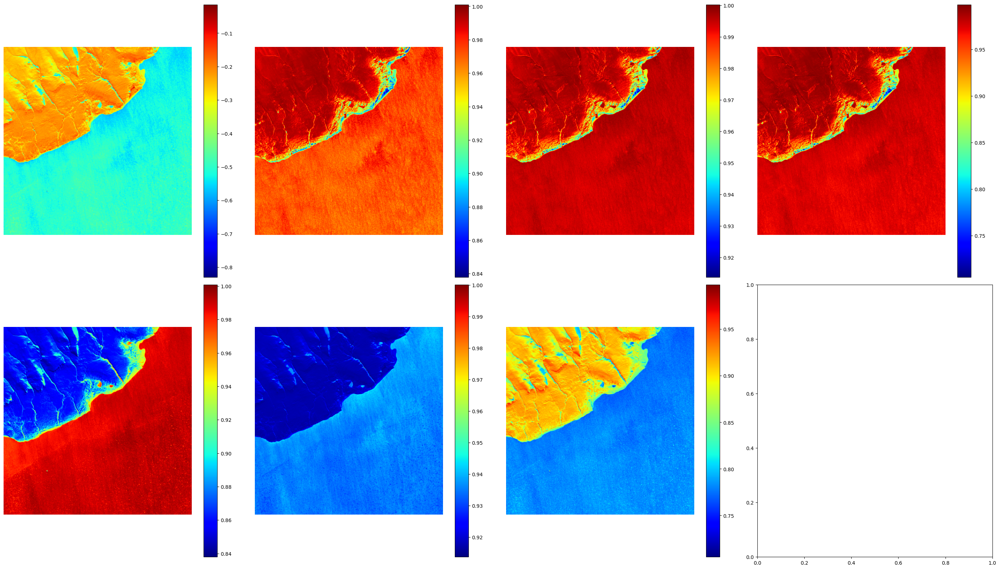

In [17]:
VisualizeIdxs(Dataset)

In [ ]:
Labels = setLabels(Dataset)

In [ ]:
VisualiseDatasetNLabels(Dataset, Labels)

In [ ]:
SaveDatasetNLabels(Dataset, Labels, datasets_path, Landsat8_dirs_paths)